In [10]:
import h5py
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
import numpy as np

In [8]:
# !ls /1-fnp/petasaur/p-jbod1/das4orcas/incoming/decimator/decimator_2024-11-15*

In [48]:
# file = '/data/fast1/das4orcas_prelim/decimator_2024-10-25_23.44.00_UTC_006608.h5'
file = '/1-fnp/petasaur/p-jbod1/das4orcas/incoming/decimator/decimator_2024-11-15_00.04.00_UTC_035428.h5'

data = h5py.File(file)
attrs=dict(data['Acquisition'].attrs)
das = np.array(data['Acquisition/Raw[0]/RawData'])
time = np.array(data['Acquisition/Raw[0]/RawDataTime'])
data.close()
dt = 1/attrs['MaximumFrequency']/2
dx = attrs['SpatialSamplingInterval']
nt,nx = das.shape

x = np.linspace(0,nx*dx,nx)
t = np.linspace(0,nt*dt,nt)

In [61]:
b,a = butter(2,[2,10],'bandpass',fs=1/dt)
data_hf = filtfilt(b,a,das,axis=0)

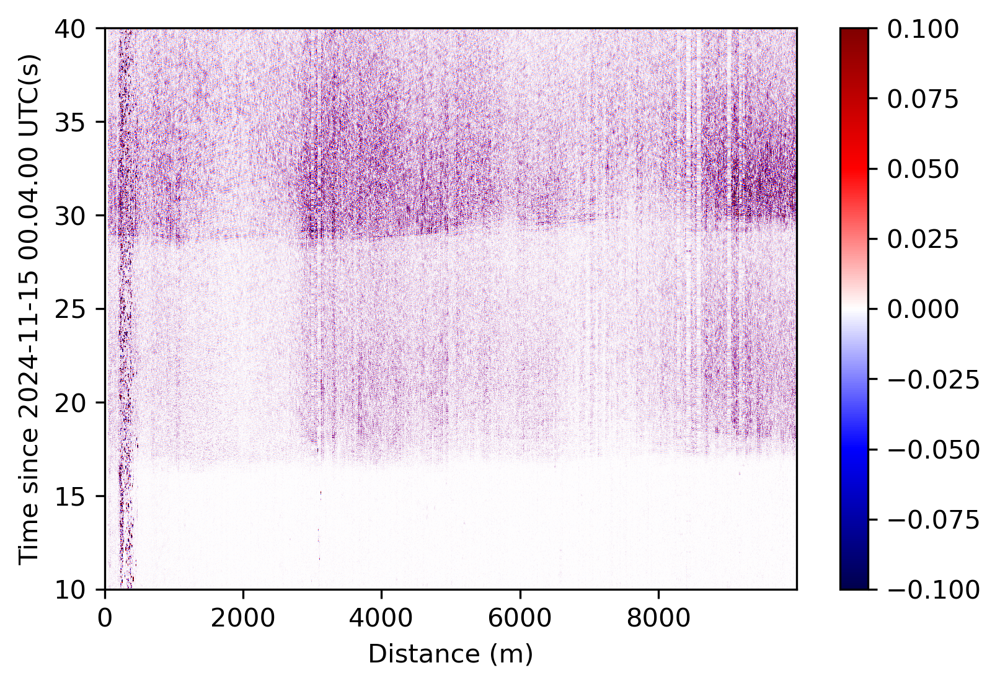

In [71]:
vm = 0.1
plt.subplots(dpi=300)
c=plt.imshow(data_hf,aspect='auto',cmap='seismic',
             vmin=-vm,vmax=vm,extent=[x[0],x[-1],t[-1],t[0]])
plt.colorbar(c)
plt.xlabel('Distance (m)')
plt.ylabel('Time since 2024-11-15 00.04.00 UTC(s)')
# plt.savefig(file+'.png')
plt.ylim([10,40])
plt.show()

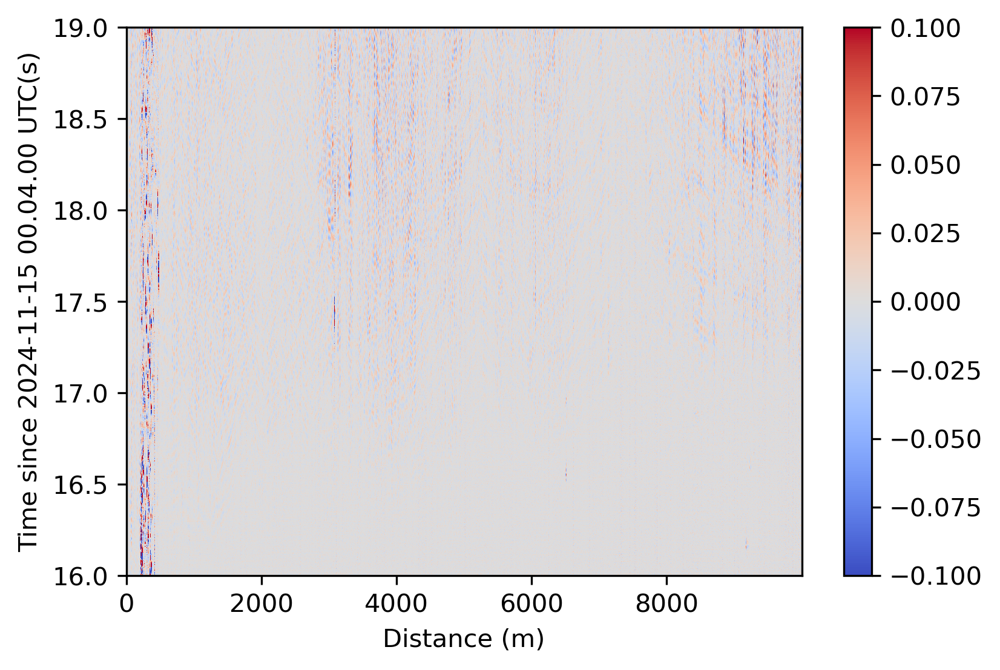

In [72]:
vm = 0.1
plt.subplots(dpi=300)
c=plt.imshow(data_hf,aspect='auto',cmap='coolwarm',
             vmin=-vm,vmax=vm,extent=[x[0],x[-1],t[-1],t[0]])
plt.colorbar(c)
plt.xlabel('Distance (m)')
plt.ylabel('Time since 2024-11-15 00.04.00 UTC(s)')
# plt.savefig(file+'.png')
plt.ylim([16,19])
plt.show()

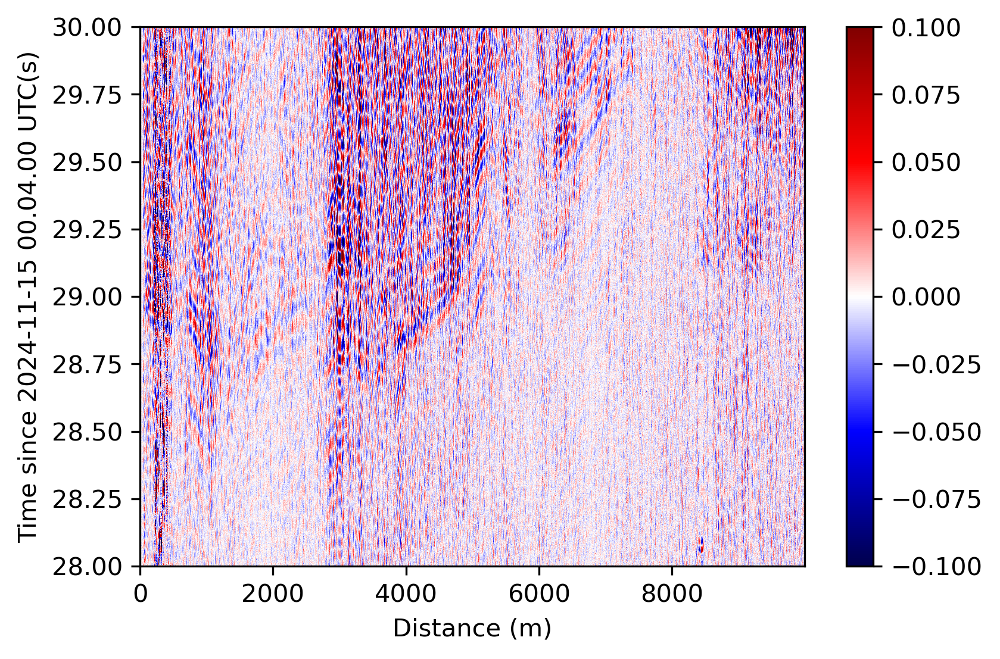

In [75]:
vm = 0.1
plt.subplots(dpi=300)
c=plt.imshow(data_hf,aspect='auto',cmap='seismic',
             vmin=-vm,vmax=vm,extent=[x[0],x[-1],t[-1],t[0]])
plt.colorbar(c)
plt.xlabel('Distance (m)')
plt.ylabel('Time since 2024-11-15 00.04.00 UTC(s)')
# plt.savefig(file+'.png')
plt.ylim([28,30])
plt.show()

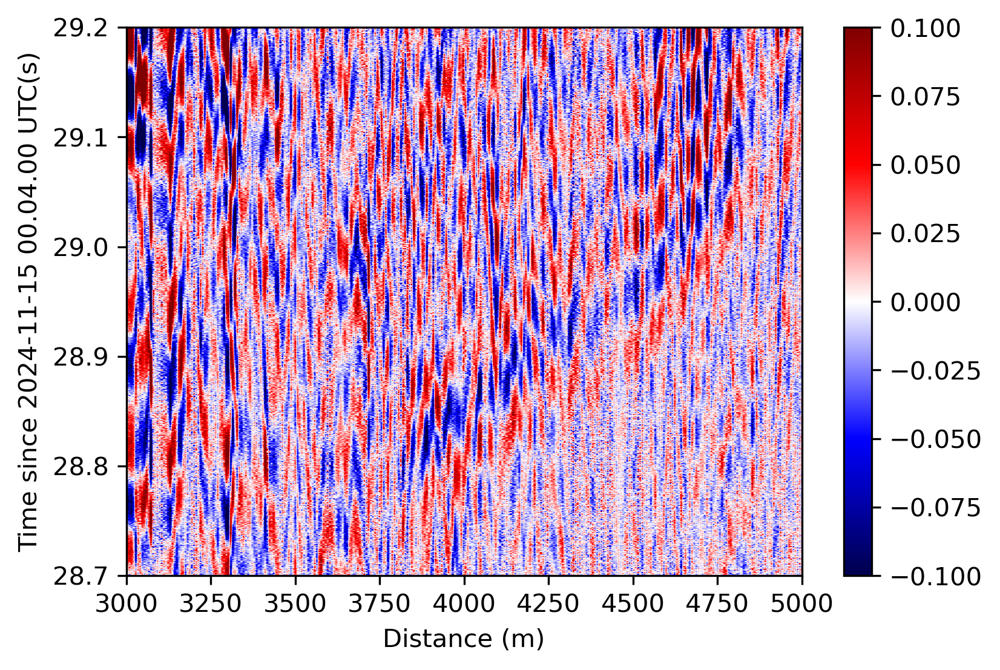

In [77]:
vm = 0.1
plt.subplots(dpi=300)
c=plt.imshow(data_hf,aspect='auto',cmap='seismic',
             vmin=-vm,vmax=vm,extent=[x[0],x[-1],t[-1],t[0]])
plt.colorbar(c)
plt.xlabel('Distance (m)')
plt.ylabel('Time since 2024-11-15 00.04.00 UTC(s)')
# plt.savefig(file+'.png')
plt.ylim([28.7,29.2])
plt.xlim([3500,5000])
plt.show()

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift, fftfreq

# 2D FFT
fft_result = fft2(das)  # Compute 2D FFT
fft_result_shifted = fftshift(fft_result)  # Shift zero frequency to center
magnitude = np.abs(fft_result_shifted)  # Take the magnitude

# Create frequency and wavenumber axes
kx = fftfreq(len(x), d=(x[1] - x[0]))  # Wavenumber
kx_shifted = fftshift(kx)  # Shift for centered display
ft = fftfreq(len(t), d=(t[1] - t[0]))  # Frequency
ft_shifted = fftshift(ft)  # Shift for centered display

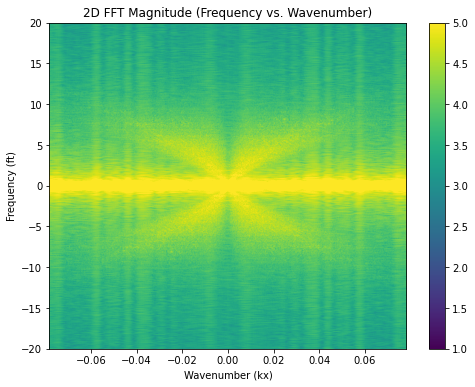

In [67]:
# Plot the 2D FFT
plt.figure(figsize=(8, 6))
extent = [kx_shifted[0], kx_shifted[-1], ft_shifted[0], ft_shifted[-1]]
plt.imshow(np.log10(magnitude), extent=extent, origin="lower", aspect="auto", cmap="viridis",
          vmin=1,vmax=5)
plt.colorbar()
plt.xlabel("Wavenumber (kx)")
plt.ylabel("Frequency (ft)")
plt.title("2D FFT Magnitude (Frequency vs. Wavenumber)")
plt.ylim([-20,20])
plt.show()

In [69]:
from scipy.fft import fft2, ifft2, fftshift, ifftshift, fftfreq

X, T = np.meshgrid(x, t)

# filter bounds
v1, v2 = 500, 2000  # Speeds in m/s

# Step 1: Perform 2D FFT
fft_data = fft2(das)
fft_data_shifted = fftshift(fft_data)  # Shift zero frequency to center

# Step 2: Create frequency and wavenumber axes
dt = t[1] - t[0]
dx = x[1] - x[0]
nt = len(t)
nx = len(x)

# Frequency and wavenumber arrays
f = fftfreq(nt, d=dt)  # Frequency in Hz
k = fftfreq(nx, d=dx)  # Wavenumber in cycles per meter
f_shifted = fftshift(f)
k_shifted = fftshift(k)

# Create 2D grids of frequency and wavenumber
K, F = np.meshgrid(k_shifted, f_shifted)

# Step 3: Compute Wave Speeds at Each Point
with np.errstate(divide='ignore', invalid='ignore'):
    # Wave speed v = f / k
    V = np.abs(F / K)
    V[np.isinf(V)] = np.nan  # Handle division by zero (k=0)

# Step 4: Construct the fk Filter Mask
v_min = 100    # Minimum wave speed in m/s
v_max = 5000   # Maximum wave speed in m/s

# Create mask: True where speed is within desired range
mask = (V >= v_min) & (V <= v_max)

# Handle k=0 separately (vertical lines in space domain)
mask[np.isnan(V)] = False

# Step 5: Apply the fk Filter
fft_data_filtered = fft_data_shifted * mask

# Step 6: Inverse FFT to Return to Space-Time Domain
# Unshift the filtered data
fft_data_filtered_unshifted = ifftshift(fft_data_filtered)
# Inverse FFT
data_filtered = np.real(ifft2(fft_data_filtered_unshifted))


# Filter the data one more time!
b,a = butter(2,[2,10],'bandpass',fs=1/dt)
data_doublefilt = filtfilt(b,a,das,axis=0)

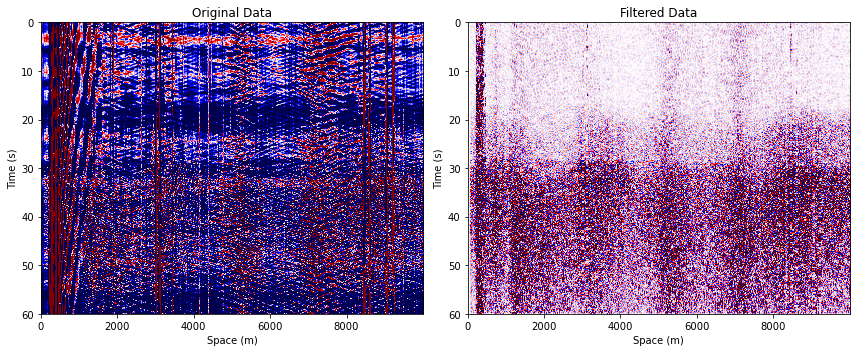

In [80]:
# Step 7: Visualize the Results

# Original Data
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
extent = [x[0], x[-1], t[-1], t[0]]
plt.imshow(das, extent=extent, aspect='auto', cmap='seismic',vmin=-0.1,vmax=0.1)
plt.title('Original Data')
plt.xlabel('Space (m)')
plt.ylabel('Time (s)')

# Filtered Data
vm = 0.1
plt.subplot(1, 2, 2)
plt.imshow(data_doublefilt, extent=extent, aspect='auto', cmap='seismic',vmin=-vm,vmax=vm)
plt.title('Filtered Data')
plt.xlabel('Space (m)')
plt.ylabel('Time (s)')
plt.tight_layout()
plt.show()

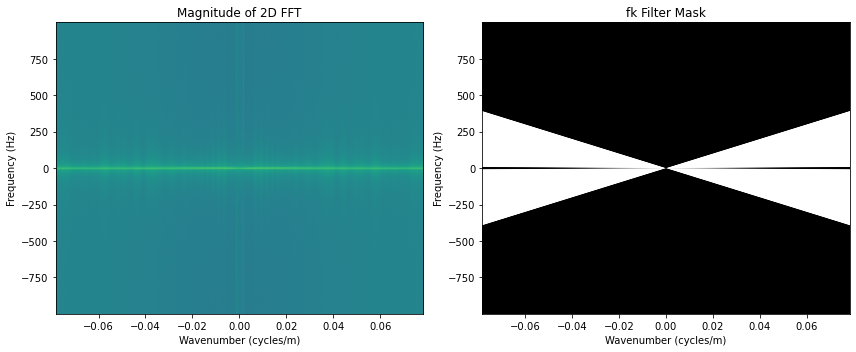

In [78]:
# Optional: Visualize the fk Spectrum and the Mask
# Magnitude of the shifted FFT data
magnitude = np.abs(fft_data_shifted)

# Plot the fk spectrum with the mask overlay
plt.figure(figsize=(12, 5))

# fk Spectrum
plt.subplot(1, 2, 1)
extent_fk = [k_shifted[0], k_shifted[-1], f_shifted[0], f_shifted[-1]]
plt.imshow(np.log10(magnitude), extent=extent_fk, aspect='auto', origin='lower', cmap='viridis')
plt.title('Magnitude of 2D FFT')
plt.xlabel('Wavenumber (cycles/m)')
plt.ylabel('Frequency (Hz)')

# Mask
plt.subplot(1, 2, 2)
plt.imshow(mask, extent=extent_fk, aspect='auto', origin='lower', cmap='gray')
plt.title('fk Filter Mask')
plt.xlabel('Wavenumber (cycles/m)')
plt.ylabel('Frequency (Hz)')
plt.tight_layout()
plt.show()